# Онлайн-хакатон Райффайзенбанка в области Data Science

## Решение

### Установим необходимые библиотеки

In [1]:
#pip install tqdm matplotlib catboost keplergl

In [2]:
import pandas as pd
import typing
from matplotlib import pyplot as plt
import numpy as np
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.model_selection import train_test_split


from sklearn.metrics import roc_auc_score
from sklearn.base import clone
from tqdm.auto import tqdm

import lightgbm as lgbm
import multiprocessing

import folium
from folium import plugins

import seaborn as sns

np.random.seed(42)

### Метрика

Метрика, которую предоставили организаторы

In [3]:
# реализация метрики от организаторов
THRESHOLD = 0.15
NEGATIVE_WEIGHT = 1.1

def deviation_metric_one_sample(y_true: typing.Union[float, int], y_pred: typing.Union[float, int]) -> float:
    """
    Реализация кастомной метрики для хакатона.

    :param y_true: float, реальная цена
    :param y_pred: float, предсказанная цена
    :return: float, значение метрики
    """
    deviation = (y_pred - y_true) / np.maximum(1e-8, y_true)
    if np.abs(deviation) <= THRESHOLD:
        return 0
    elif deviation <= - 4 * THRESHOLD:
        return 9 * NEGATIVE_WEIGHT
    elif deviation < -THRESHOLD:
        return NEGATIVE_WEIGHT * ((deviation / THRESHOLD) + 1) ** 2
    elif deviation < 4 * THRESHOLD:
        return ((deviation / THRESHOLD) - 1) ** 2
    else:
        return 9


def deviation_metric(y_true: np.array, y_pred: np.array) -> float:
    return np.array([deviation_metric_one_sample(y_true[n], y_pred[n]) for n in range(len(y_true))]).mean()


### Загрузка данных

In [4]:
train = pd.read_csv('./baseline/data/train.csv').rename({'per_square_meter_price': 'target'}, axis=1)
test = pd.read_csv('./baseline/data/test.csv').rename({'per_square_meter_price': 'target'}, axis=1)
#test['train'] = 0
test['target'] = 0

#train['train'] = 1

#dataset = pd.concat([train, test])

/opt/conda/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


### Первичный взгляд на данные

In [5]:
train.head()

,city,floor,id,lat,lng,osm_amenity_points_in_0.001,osm_amenity_points_in_0.005,osm_amenity_points_in_0.0075,osm_amenity_points_in_0.01,osm_building_points_in_0.001,...,reform_mean_floor_count_1000,reform_mean_floor_count_500,reform_mean_year_building_1000,reform_mean_year_building_500,region,total_square,street,date,realty_type,price_type
0,Пермь,NaN,COL_0,57.998207,56.292797,4,19,35,52,0,...,5.762963,5.530612,1964.118519,1960.959184,Пермский край,32.0,S27289,2020-01-05,10,0
1,Шатура,NaN,COL_1,55.574284,39.543835,3,24,37,59,0,...,2.894366,3.527778,1952.321678,1957.222222,Московская область,280.0,S17052,2020-01-05,10,0
2,Ярославль,NaN,COL_2,57.619140,39.850525,1,30,67,128,0,...,6.141414,7.222222,1968.150000,1973.370370,Ярославская область,297.4,S16913,2020-01-05,110,0
3,Новокузнецк,NaN,COL_3,53.897083,87.108604,0,0,5,21,0,...,8.581081,9.000000,1992.716216,2014.000000,Кемеровская область,190.0,S10148,2020-01-05,110,0
4,Москва,NaN,COL_4,55.802590,37.487110,1,23,64,153,0,...,7.263889,5.684211,1963.229167,1960.500000,Москва,60.2,S1338,2020-01-05,10,0


In [6]:
test.head()

,city,floor,id,osm_amenity_points_in_0.001,osm_amenity_points_in_0.005,osm_amenity_points_in_0.0075,osm_amenity_points_in_0.01,osm_building_points_in_0.001,osm_building_points_in_0.005,osm_building_points_in_0.0075,...,reform_mean_year_building_500,region,lat,lng,total_square,street,date,realty_type,price_type,target
0,Курск,1.0,COL_289284,7,55,85,117,0,0,0,...,1966.740260,Курская область,51.709255,36.147908,156.148996,S6983,2020-09-06,100,1,0
1,Сургут,1.0,COL_289305,8,70,112,140,0,0,0,...,1989.068182,Ханты-Мансийский АО,61.233240,73.462509,190.737943,S29120,2020-09-06,110,1,0
2,Тюмень,-1.0,COL_289318,3,28,67,122,0,0,0,...,1991.458333,Тюменская область,57.143110,65.554573,457.118051,S23731,2020-09-06,10,1,0
3,Иркутск,1.0,COL_289354,5,76,139,231,0,0,0,...,1941.657895,Иркутская область,52.281380,104.282975,66.503622,S14207,2020-09-06,100,1,0
4,Курск,NaN,COL_289399,8,105,189,279,0,0,2,...,1946.689655,Курская область,51.729706,36.194019,23.864915,S20658,2020-09-06,10,1,0


In [7]:
print(train.shape)
print(test.shape)

(279792, 77)
(2974, 77)


In [8]:
train.describe()

,lat,lng,osm_amenity_points_in_0.001,osm_amenity_points_in_0.005,osm_amenity_points_in_0.0075,osm_amenity_points_in_0.01,osm_building_points_in_0.001,osm_building_points_in_0.005,osm_building_points_in_0.0075,osm_building_points_in_0.01,...,reform_count_of_houses_500,reform_house_population_1000,reform_house_population_500,reform_mean_floor_count_1000,reform_mean_floor_count_500,reform_mean_year_building_1000,reform_mean_year_building_500,total_square,realty_type,price_type
count,279792.000000,279792.000000,279792.000000,279792.000000,279792.000000,279792.000000,279792.000000,279792.000000,279792.000000,279792.000000,...,279792.000000,265196.000000,252558.000000,263084.000000,249624.000000,263553.000000,250155.000000,279792.000000,279792.000000,279792.000000
mean,54.364078,47.763540,2.709084,40.605146,81.596171,133.285458,0.037442,0.885701,2.046467,3.748163,...,30.110661,2042.541716,644.610557,7.051233,7.360464,1967.532599,1967.988580,507.833604,54.974088,0.016058
std,4.245713,17.044625,4.202451,53.293388,105.193169,172.290136,0.391014,6.858338,14.801566,25.679859,...,27.686234,1359.884747,445.699329,3.542084,4.231369,45.807699,54.110015,1704.251771,47.856417,0.125700
min,42.651897,19.892178,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,5.100000,10.000000,0.000000
25%,53.226600,37.582988,0.000000,7.000000,16.000000,28.000000,0.000000,0.000000,0.000000,0.000000,...,10.000000,932.000000,290.000000,4.591837,4.619959,1960.070000,1959.890097,65.900000,10.000000,0.000000
50%,55.679090,39.702435,1.000000,22.000000,46.000000,77.000000,0.000000,0.000000,0.000000,0.000000,...,25.000000,1949.000000,602.000000,6.368932,6.395349,1970.890411,1971.647059,128.737034,10.000000,0.000000
75%,56.306976,55.957523,4.000000,51.000000,101.000000,164.000000,0.000000,0.000000,1.000000,2.000000,...,43.000000,2978.000000,936.000000,8.698925,9.100000,1983.701754,1986.950000,336.000000,110.000000,0.000000
max,69.500740,151.777000,46.000000,468.000000,851.000000,1392.000000,30.000000,586.000000,949.000000,1162.000000,...,289.000000,18392.000000,6105.000000,53.717949,221.666667,2019.000000,2020.000000,40000.000000,110.000000,1.000000


In [9]:
test.describe()

,osm_amenity_points_in_0.001,osm_amenity_points_in_0.005,osm_amenity_points_in_0.0075,osm_amenity_points_in_0.01,osm_building_points_in_0.001,osm_building_points_in_0.005,osm_building_points_in_0.0075,osm_building_points_in_0.01,osm_catering_points_in_0.001,osm_catering_points_in_0.005,...,reform_mean_floor_count_1000,reform_mean_floor_count_500,reform_mean_year_building_1000,reform_mean_year_building_500,lat,lng,total_square,realty_type,price_type,target
count,2974.00000,2974.000000,2974.000000,2974.000000,2974.000000,2974.000000,2974.000000,2974.000000,2974.000000,2974.000000,...,2939.000000,2926.000000,2939.000000,2926.000000,2974.000000,2974.000000,2974.000000,2974.000000,2974.0,2974.0
mean,3.47579,56.622058,116.339946,188.180901,0.028917,0.447209,0.949227,1.603564,0.886348,14.358440,...,6.213200,6.450586,1964.728803,1965.403824,55.466594,63.153755,406.735382,57.367182,1.0,0.0
std,4.94299,79.150088,164.979277,268.308805,0.215067,2.342604,5.335099,9.886568,2.044048,29.650378,...,2.513380,2.988967,31.747532,36.133107,3.479215,26.592173,1063.619932,47.218940,0.0,0.0
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1625.304054,1403.214286,42.814200,20.142404,7.279623,10.000000,1.0,0.0
25%,0.00000,15.000000,32.000000,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,4.617053,4.571429,1959.597205,1958.500000,53.217885,36.581435,97.288057,10.000000,1.0,0.0
50%,2.00000,32.000000,66.000000,104.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,...,5.658915,5.750000,1969.900000,1970.703637,55.978571,60.546986,181.066253,100.000000,1.0,0.0
75%,4.00000,60.000000,119.000000,193.000000,0.000000,0.000000,1.000000,1.000000,1.000000,11.000000,...,7.160740,7.727885,1980.825432,1983.838773,56.837790,87.202715,368.433009,100.000000,1.0,0.0
max,47.00000,446.000000,855.000000,1375.000000,4.000000,98.000000,247.000000,490.000000,20.000000,166.000000,...,29.838710,26.857143,2015.583333,2020.000000,69.356995,132.872232,31124.725426,110.000000,1.0,0.0


**Посмотрим на количество пропусков**

In [10]:
def get_nans_df(data):
    total = data.isnull().sum().sort_values(ascending=False) # переменная total, содержащая количество пропусков для каждого признака
    percent = (data.isnull().sum() / data.isnull().count() * 100).sort_values(ascending=False) # доля пропусков для каждого признака
    missing_data = pd.concat([total, percent], axis = 1, keys = ['Total_missing_values', 'Percent %'])
    missing_data['dtype'] = data.dtypes
    missing_data =  missing_data.query('Total_missing_values != 0').reset_index()
    return missing_data

In [11]:
nan_train = get_nans_df(train)
nan_train

,index,Total_missing_values,Percent %,dtype
0,floor,176237,62.988577,object
1,reform_mean_floor_count_500,30168,10.782295,float64
2,reform_mean_year_building_500,29637,10.592512,float64
3,reform_house_population_500,27234,9.733659,float64
4,reform_mean_floor_count_1000,16708,5.971579,float64
5,reform_mean_year_building_1000,16239,5.803954,float64
6,reform_house_population_1000,14596,5.216732,float64
7,street,1606,0.573998,object
8,osm_city_nearest_population,55,0.019657,float64


In [12]:
nan_test = get_nans_df(test)
nan_test

,index,Total_missing_values,Percent %,dtype
0,floor,1301,43.745797,object
1,reform_mean_year_building_500,48,1.613988,float64
2,reform_house_population_500,48,1.613988,float64
3,reform_mean_floor_count_500,48,1.613988,float64
4,reform_house_population_1000,35,1.176866,float64
5,reform_mean_floor_count_1000,35,1.176866,float64
6,reform_mean_year_building_1000,35,1.176866,float64
7,street,6,0.201748,object


**Посмотрим на количество дубликатов**

In [13]:
print(train.duplicated().sum())
print(test.duplicated().sum())

0
0


**Найдем категориальные признаки**

In [14]:
# на трейне
num_cols_train = train._get_numeric_data().columns
cat_cols_train = list(set(train.columns) - set(num_cols_train))
cat_cols_train

['floor', 'city', 'osm_city_nearest_name', 'street', 'date', 'id', 'region']

In [15]:
num_cols_test = test._get_numeric_data().columns
cat_cols_test = list(set(test.columns) - set(num_cols_test))
cat_cols_test

['floor', 'city', 'osm_city_nearest_name', 'street', 'date', 'id', 'region']

**Итого:** обучающая выборка содержит 279792 объектов, тестовая - 2974. Больше всего пропусков содержит признак *floor* - в трейне около 62%, в тесте 43% пропусков. Однако, данный признак является одним из ключевых при продаже/покупке недвижимости, поэтому избавиться от него нельзя. Так данные содержат 7 категориальных признаков.

### Проанализируем некоторые признаки

**Target**

In [16]:
train['target'].describe()

count    2.797920e+05
mean     1.101955e+05
std      1.720506e+05
min      3.896104e+02
25%      2.970149e+04
50%      5.971068e+04
75%      1.193000e+05
max      1.990000e+06
Name: target, dtype: float64

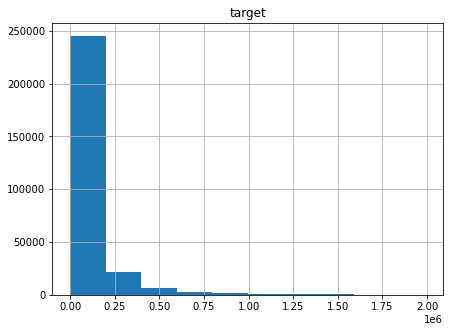

In [17]:
# посмотрим на распределение таргета
fig, ax = plt.subplots(figsize=(7,5))
train[['target']].hist(ax=ax)
plt.show()

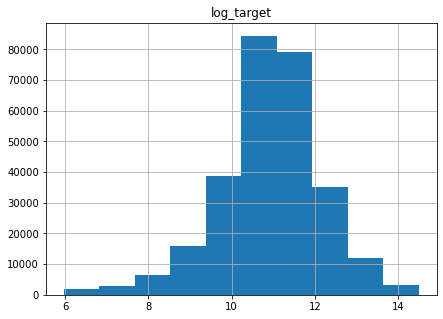

In [18]:
train['log_target'] = np.log(train['target'])
test['log_target'] = 0
fig, ax = plt.subplots(figsize=(7,5))
train[['log_target']].hist(ax=ax)
plt.show()

**Итого:** замечено, что распределение целевой переменной похоже на логнормальное распределение. Поэтому принято решение создать еще один признак - логарифм от таргета. Как видно на втором графике, логарифмирование привело таргет к распредению очень похожему на нормальное.

**Date**

In [19]:
# приведем признак к нужному формату
train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])

In [20]:
# посмотрим за какой период представлены данные
print('TRAIN')
print("Year:",train['date'].dt.year.value_counts())
print('Min date:', train['date'].min())
print('Max date:', train['date'].max())

print('-----------------------')
# посмотрим за какой период представлены данные
print('TEST')
print("Year:",test['date'].dt.year.value_counts())
print('Min date:', test['date'].min())
print('Max date:', test['date'].max())

TRAIN
Year: 2020    279792
Name: date, dtype: int64
Min date: 2020-01-05 00:00:00
Max date: 2020-08-23 00:00:00
-----------------------
TEST
Year: 2020    2974
Name: date, dtype: int64
Min date: 2020-09-06 00:00:00
Max date: 2020-12-27 00:00:00


In [21]:
# создадим отдельно признак "месяц", чтобы посмотреть на количество объектов по месяцам
train['month'] = (
    train['date'].dt.floor('d') + pd.offsets.MonthEnd(0) - pd.offsets.MonthBegin(1)
)
test['month'] = (
    test['date'].dt.floor('d') + pd.offsets.MonthEnd(0) - pd.offsets.MonthBegin(1)
)

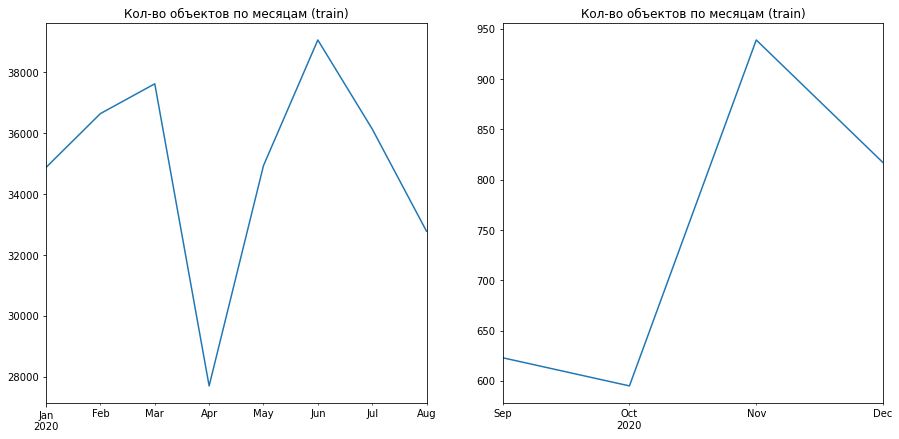

In [22]:
fig,ax = plt.subplots(1,2,figsize=(15,7))
train['month'].value_counts().sort_index().plot(ax=ax[0], title='Кол-во объектов по месяцам (train)');
test['month'].value_counts().sort_index().plot(title='Кол-во объектов по месяцам (train)');

**Итого:** обучающая выборка представлена данными с января по август 2020, причем очень мало данных за апрелью В тестовой же выборке представлены данный с сентября по декабрь, из них больше всего данных за ноябрь и декабрь.

**City**

In [23]:
print(train['city'].unique().shape)
print(test['city'].unique().shape)

(4948,)
(165,)


In [24]:
train.city.value_counts() / train.shape[0]

Москва                                        0.200134
Санкт-Петербург                               0.067572
Краснодар                                     0.046495
Екатеринбург                                  0.030666
Новосибирск                                   0.024136
                                                ...   
Приозерский район, пос. Сосново               0.000004
Тула муниципальное образование, д. Кишкино    0.000004
Сосновский район, д. Казанцево                0.000004
Белореченский район, пос. Родники             0.000004
Елкин                                         0.000004
Name: city, Length: 4948, dtype: float64

In [25]:
test.city.value_counts() / test.shape[0]

Красноярск         0.136180
Иркутск            0.076664
Санкт-Петербург    0.068931
Томск              0.046402
Петрозаводск       0.045730
                     ...   
Строитель          0.000336
Сарапул            0.000336
Кузьмоловский      0.000336
Тутаев             0.000336
Чебаркуль          0.000336
Name: city, Length: 165, dtype: float64

In [26]:
# количество уникальных названий населенных пунктов, содержащих пробел
idx = train['city'].str.contains(' ').reset_index().query('city==True').index #.query("' ' in city")['city']
print(train.iloc[idx]['city'].unique().shape)

(2675,)


In [27]:
train['city'] = train['city'].replace({', ': ',',
                                       '. ':'.'})
test['city'] = test['city'].replace({', ': ',',
                                       '. ':'.'})

In [28]:
train['city'] = train['city'].str.lower()
test['city'] = test['city'].str.lower()

In [29]:
print(train['city'].unique().shape)
print(test['city'].unique().shape)

(4947,)
(165,)


**Итого:** около 20% объектов обучающей выборки представлено Москвой, при этом в тестовой выборке больше всего объектов из Красноярска - 13%. Москва же не вошла в топ-5 на тесте.

**Region**

In [30]:
print(train['region'].unique().shape)
print(test['region'].unique().shape)

(49,)
(47,)


In [31]:
print((train['region'].value_counts() / train['region'].shape[0])[:20])
print('--------------')
print((test['region'].value_counts() / test['region'].shape[0])[:20])

Москва                   0.200013
Краснодарский край       0.083069
Санкт-Петербург          0.067507
Московская область       0.058358
Свердловская область     0.044622
Челябинская область      0.032546
Татарстан                0.032395
Самарская область        0.031606
Ростовская область       0.029869
Башкортостан             0.027760
Новосибирская область    0.027428
Нижегородская область    0.024350
Тюменская область        0.024036
Ставропольский край      0.020401
Пермский край            0.019536
Красноярский край        0.018735
Воронежская область      0.016673
Саратовская область      0.016248
Кемеровская область      0.015333
Иркутская область        0.014128
Name: region, dtype: float64
--------------
Красноярский край        0.146604
Иркутская область        0.095831
Санкт-Петербург          0.068258
Карелия                  0.048420
Томская область          0.047747
Свердловская область     0.046402
Кемеровская область      0.045057
Нижегородская область    0.033961
Курс

**Итого:** аналогично предыдущему признаку.

**Floor**

In [32]:
train['floor'].unique()

array([nan, 3.0, 4.0, -1.0, 1.0, 14.0, 2.0, 8.0, -2.0, 6.0, 10.0, 5.0,
       16.0, 19.0, 7.0, 9.0, 58.0, 24.0, 18.0, 26.0, 17.0, 48.0, 11.0,
       -3.0, 15.0, 22.0, 60.0, 12.0, 21.0, 35.0, 28.0, 38.0, 39.0, 13.0,
       81.0, 44.0, 82.0, 25.0, 45.0, 47.0, 23.0, 37.0, 29.0, 113.0, 78.0,
       42.0, 69.0, 27.0, 46.0, 53.0, 80.0, 70.0, 76.0, 64.0, 30.0, 73.0,
       77.0, 52.0, 67.0, 65.0, 20.0, 40.0, 49.0, 75.0, 93.0, 94.0, 91.0,
       72.0, 79.0, 84.0, 92.0, 33.0, 66.0, 90.0, 31.0, 36.0, 61.0, 71.0,
       68.0, 51.0, 97.0, 43.0, 95.0, 85.0, 50.0, 0.0, 62.0, 54.0, 74.0,
       57.0, 41.0, 34.0, 59.0, 56.0, 123.0, 55.0, 83.0, '27.0', '1.0',
       '5.0', '-1.0', '67.0', '2.0', '0.0', '4.0', '6.0', '3.0', '15.0',
       '10.0', '11.0', '30.0', '12.0', '-2.0', '14.0', '36.0', '8.0',
       '50.0', '17.0', '19.0', '37.0', '68.0', '7.0', '42.0', '9.0',
       '16.0', '20.0', '53.0', '91.0', '84.0', '38.0', '21.0', '48.0',
       '22.0', '23.0', '1', '18.0', 'подвал, 1', '2', 'подвал',
  

In [33]:
test['floor'].unique()

array(['1.0', '-1.0', nan, '2,3', '2', '-2.0', '5.0', '4', '1', '5',
       '1, 2', '1,2,3', '2.0', '4.0', '1,2,3,4', 'цоколь', '3', 'подвал',
       '3.0', '11.0', '9.0', '12.0', '0.0', 'цоколь, 1, 2,3,4,5,6', '6',
       '1,2', ' 1, 2, Антресоль', '6.0', '3 этаж, мансарда (4 этаж)',
       'цокольный', '1-й, 2-й', '13', '1, подвал', '7', '1, 2, 3', '1,2 ',
       '14', '9', 'подвал,1', '1-й', '8', '3,4', 'мансарда',
       'подвал, 1 и 4 этаж', '10.0', '5(мансарда)',
       'технический этаж,5,6', ' 1-2, подвальный', '1, 2, 3, мансардный',
       '8.0', '7.0', 'подвал, 1, 2, 3',
       '1,2,3, антресоль, технический этаж', '3, 4', '4, 5',
       '1-3 этажи, цоколь (188,4 кв.м), подвал (104 кв.м)',
       '1,2,3,4, подвал', '2-й', '1, 2 этаж', '1,2,3,4,5', 'подвал, 1, 2',
       '1-7', '1 (по док-м цоколь)', '1-й, подвал', '10', '1,2,подвал ',
       '13.0', 'подвал, 2', '1, цоколь', 'подвал,1,2,3',
       '1,2,3 этаж, подвал', 'цоколь, 1', '2, 3, 4, тех.этаж',
       'цокольный, 1,2'

In [34]:
# как видно из значений признака floor его данные следует привести к корректному виду
# проведем корректировку вручную

def process_floor(dataset):
    dataset['floor'] = dataset['floor'].mask(dataset['floor'] == '-1.0', -1) \
              .mask(dataset['floor'] == '-2.0', -2) \
              .mask(dataset['floor'] == '-3.0', -3) \
              .mask(dataset['floor'] == 'подвал, 1', 1) \
              .mask(dataset['floor'] == 'подвал', -1) \
              .mask(dataset['floor'] == 'цоколь, 1', 1) \
              .mask(dataset['floor'] == '1,2,антресоль', 1) \
              .mask(dataset['floor'] == 'цоколь', 0) \
              .mask(dataset['floor'] == 'тех.этаж (6)', 6) \
              .mask(dataset['floor'] == 'Подвал', -1) \
              .mask(dataset['floor'] == 'Цоколь', 0) \
              .mask(dataset['floor'] == 'фактически на уровне 1 этажа', 1) \
              .mask(dataset['floor'] == '1,2,3', 1) \
              .mask(dataset['floor'] == '1, подвал', 1) \
              .mask(dataset['floor'] == '1,2,3,4', 1) \
              .mask(dataset['floor'] == '1,2', 1) \
              .mask(dataset['floor'] == '1,2,3,4,5', 1) \
              .mask(dataset['floor'] == '5, мансарда', 5) \
              .mask(dataset['floor'] == '1-й, подвал', 1) \
              .mask(dataset['floor'] == '1, подвал, антресоль', 1) \
              .mask(dataset['floor'] == 'мезонин', 2) \
              .mask(dataset['floor'] == 'подвал, 1-3', 1) \
              .mask(dataset['floor'] == '1 (Цокольный этаж)', 0) \
              .mask(dataset['floor'] == '3, Мансарда (4 эт)', 3) \
              .mask(dataset['floor'] == 'подвал,1', 1) \
              .mask(dataset['floor'] == '1, антресоль', 1) \
              .mask(dataset['floor'] == '1-3', 1) \
              .mask(dataset['floor'] == 'мансарда (4эт)', 4) \
              .mask(dataset['floor'] == '1, 2.', 1) \
              .mask(dataset['floor'] == 'подвал , 1 ', 1) \
              .mask(dataset['floor'] == '1, 2', 1) \
              .mask(dataset['floor'] == 'подвал, 1,2,3', 1) \
              .mask(dataset['floor'] == '1 + подвал (без отделки)', 1) \
              .mask(dataset['floor'] == 'мансарда', 3) \
              .mask(dataset['floor'] == '2,3', 2) \
              .mask(dataset['floor'] == '4, 5', 4) \
              .mask(dataset['floor'] == '1-й, 2-й', 1) \
              .mask(dataset['floor'] == '1 этаж, подвал', 1) \
              .mask(dataset['floor'] == '1, цоколь', 1) \
              .mask(dataset['floor'] == 'подвал, 1-7, техэтаж', 1) \
              .mask(dataset['floor'] == '3 (антресоль)', 3) \
              .mask(dataset['floor'] == '1, 2, 3', 1) \
              .mask(dataset['floor'] == 'Цоколь, 1,2(мансарда)', 1) \
              .mask(dataset['floor'] == 'подвал, 3. 4 этаж', 3) \
              .mask(dataset['floor'] == 'подвал, 1-4 этаж', 1) \
              .mask(dataset['floor'] == 'подва, 1.2 этаж', 1) \
              .mask(dataset['floor'] == '2, 3', 2) \
              .mask(dataset['floor'] == '7,8', 7) \
              .mask(dataset['floor'] == '1 этаж', 1) \
              .mask(dataset['floor'] == '1-й', 1) \
              .mask(dataset['floor'] == '3 этаж', 3) \
              .mask(dataset['floor'] == '4 этаж', 4) \
              .mask(dataset['floor'] == '5 этаж', 5) \
              .mask(dataset['floor'] == 'подвал,1,2,3,4,5', 1) \
              .mask(dataset['floor'] == 'подвал, цоколь, 1 этаж', 1) \
              .mask(dataset['floor'] == '3, мансарда', 3) \
              .mask(dataset['floor'] == 'цоколь, 1, 2,3,4,5,6', 1) \
              .mask(dataset['floor'] == ' 1, 2, Антресоль', 1) \
              .mask(dataset['floor'] == '3 этаж, мансарда (4 этаж)', 3) \
              .mask(dataset['floor'] == 'цокольный', 0) \
              .mask(dataset['floor'] == '1,2 ', 1) \
              .mask(dataset['floor'] == '3,4', 3) \
              .mask(dataset['floor'] == 'подвал, 1 и 4 этаж', 1) \
              .mask(dataset['floor'] == '5(мансарда)', 5) \
              .mask(dataset['floor'] == 'технический этаж,5,6', 5) \
              .mask(dataset['floor'] == ' 1-2, подвальный', 1) \
              .mask(dataset['floor'] == '1, 2, 3, мансардный', 1) \
              .mask(dataset['floor'] == 'подвал, 1, 2, 3', 1) \
              .mask(dataset['floor'] == '1,2,3, антресоль, технический этаж', 1) \
              .mask(dataset['floor'] == '3, 4', 3) \
              .mask(dataset['floor'] == '1-3 этажи, цоколь (188,4 кв.м), подвал (104 кв.м)', 1) \
              .mask(dataset['floor'] == '1,2,3,4, подвал', 1) \
              .mask(dataset['floor'] == '2-й', 2) \
              .mask(dataset['floor'] == '1, 2 этаж', 1) \
              .mask(dataset['floor'] == 'подвал, 1, 2', 1) \
              .mask(dataset['floor'] == '1-7', 1) \
              .mask(dataset['floor'] == '1 (по док-м цоколь)', 1) \
              .mask(dataset['floor'] == '1,2,подвал ', 1) \
              .mask(dataset['floor'] == 'подвал, 2', 2) \
              .mask(dataset['floor'] == 'подвал,1,2,3', 1) \
              .mask(dataset['floor'] == '1,2,3 этаж, подвал ', 1) \
              .mask(dataset['floor'] == '1,2,3 этаж, подвал', 1) \
              .mask(dataset['floor'] == '2, 3, 4, тех.этаж', 2) \
              .mask(dataset['floor'] == 'цокольный, 1,2', 1) \
              .mask(dataset['floor'] == 'Техническое подполье', -1) \
              .mask(dataset['floor'] == '1.2', 1) \
              .astype(float)

In [35]:
process_floor(train)
process_floor(test)

In [36]:
train.floor.unique()

array([ nan,   3.,   4.,  -1.,   1.,  14.,   2.,   8.,  -2.,   6.,  10.,
         5.,  16.,  19.,   7.,   9.,  58.,  24.,  18.,  26.,  17.,  48.,
        11.,  -3.,  15.,  22.,  60.,  12.,  21.,  35.,  28.,  38.,  39.,
        13.,  81.,  44.,  82.,  25.,  45.,  47.,  23.,  37.,  29., 113.,
        78.,  42.,  69.,  27.,  46.,  53.,  80.,  70.,  76.,  64.,  30.,
        73.,  77.,  52.,  67.,  65.,  20.,  40.,  49.,  75.,  93.,  94.,
        91.,  72.,  79.,  84.,  92.,  33.,  66.,  90.,  31.,  36.,  61.,
        71.,  68.,  51.,  97.,  43.,  95.,  85.,  50.,   0.,  62.,  54.,
        74.,  57.,  41.,  34.,  59.,  56., 123.,  55.,  83.])

In [37]:
test.floor.unique()

array([ 1., -1., nan,  2., -2.,  5.,  4.,  0.,  3., 11.,  9., 12.,  6.,
       13.,  7., 14.,  8., 10.])

In [38]:
train['floor'] = train['floor'].astype(str)
test['floor'] = test['floor'].astype(str)

In [39]:
train['floor'] = train['floor'].fillna('NaN', axis=0)
test['floor'] = test['floor'].fillna('NaN', axis=0)

In [40]:
print(train['floor'].isna().sum())
print(test['floor'].isna().sum())

0
0


**Итого:** признак floor был очень зашумлен, при этом он может быть одним из самых значимых, поэтому было принято решение обработать данный признак вручную.

**Lat, lng**

Посмотрим, как распределены объекты на карте.

In [41]:
m = folium.Map([58, 76], zoom_start=3)
hm = plugins.HeatMap(train[['lat', 'lng']].values, radius=12)
hm.add_to(m)
m

In [42]:
m = folium.Map([58, 76], zoom_start=3)
hm = plugins.HeatMap(test[['lat', 'lng']].values, radius=12)
hm.add_to(m)
m

**Total_square**

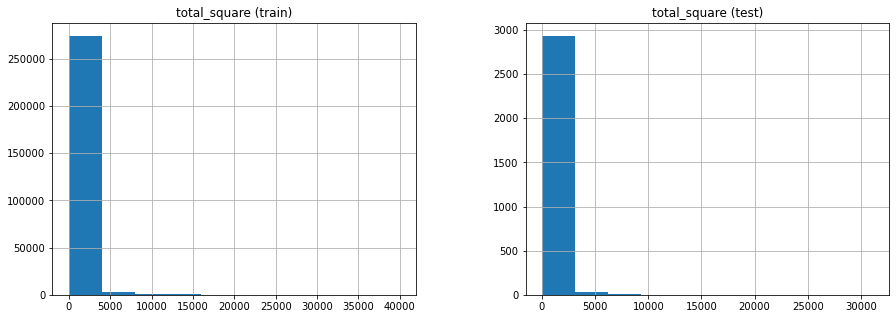

In [43]:
fig,ax=plt.subplots(1,2, figsize=(15,5))
train[['total_square']].hist(ax=ax[0])
test[['total_square']].hist(ax=ax[1])
ax[0].set_title('total_square (train)')
ax[1].set_title('total_square (test)')
plt.show()

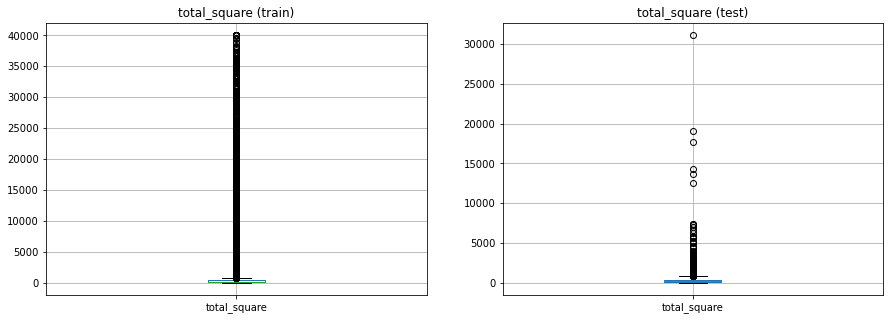

In [44]:
fig,ax=plt.subplots(1,2, figsize=(15,5))
train[['total_square']].boxplot(ax=ax[0])
test[['total_square']].boxplot(ax=ax[1])
ax[0].set_title('total_square (train)')
ax[1].set_title('total_square (test)')
plt.show()

In [45]:
train['total_square'].describe()

count    279792.000000
mean        507.833604
std        1704.251771
min           5.100000
25%          65.900000
50%         128.737034
75%         336.000000
max       40000.000000
Name: total_square, dtype: float64

In [46]:
test['total_square'].describe()

count     2974.000000
mean       406.735382
std       1063.619932
min          7.279623
25%         97.288057
50%        181.066253
75%        368.433009
max      31124.725426
Name: total_square, dtype: float64

In [47]:
train['total_square'].quantile(0.75)

336.0

In [48]:
train[train['total_square'] > train['total_square'].quantile(0.75)].shape

(69923, 79)

In [49]:
print(train['total_square'].quantile(0.90))
print(test['total_square'].quantile(0.90))

961.0
789.1623873262628


**Итого:** анализ показал, что медианное значение площади комм.недвижимости составляет 130-180 кв.м. При этом есть объекты с очень большой площадью - от 5000 до 40000 кв.м.

**osm_city_nearest_name**

In [50]:
train['osm_city_nearest_name'].unique()

array(['Пермь', 'Орехово-Зуево', 'Ярославль', 'Новокузнецк', 'Химки',
       'Самара', 'Казань', 'Саратов', 'Краснодар', 'Екатеринбург',
       'Брянск', 'Уфа', 'Калининград', 'Энгельс', 'Челябинск',
       'Зеленоград', 'Воронеж', 'Москва', 'Томск', 'Люберцы',
       'Санкт-Петербург', 'Ростов-на-Дону', 'Орёл', 'Домодедово',
       'Новомосковск', 'Альметьевск', 'Старый Оскол', 'Нижний Новгород',
       'Вологда', 'Соликамск', 'Саранск', 'Арзамас', 'Красногорск',
       'Омск', 'Мытищи', 'Барнаул', 'Братск', 'Ижевск', 'Новороссийск',
       'Ставрополь', 'Златоуст', 'Сочи', 'Муром', 'Тула',
       'Ханты-Мансийск', 'Назрань', 'Пенза', 'Нижневартовск', 'Тюмень',
       'Колпино', 'Нефтекамск', 'Ульяновск', 'Долгопрудный', 'Коломна',
       'Обнинск', 'Смоленск', 'Красноярск', 'Новокуйбышевск', 'Тверь',
       'Кострома', 'Кемерово', 'Узловая', 'Одинцово', 'Таганрог',
       'Белгород', 'Серов', 'Армавир', 'Волгоград', 'Королёв',
       'Каменск-Уральский', 'Киров', 'Курск', 'Пушкин', '

In [51]:
test['osm_city_nearest_name'].unique()

array(['Курск', 'Сургут', 'Тюмень', 'Иркутск', 'Кемерово', 'Красноярск',
       'Нижний Новгород', 'Томск', 'Санкт-Петербург', 'Вологда',
       'Новокузнецк', 'Липецк', 'Красногорск', 'Брянск', 'Иваново',
       'Петрозаводск', 'Белгород', 'Ижевск', 'Сочи', 'Нижневартовск',
       'Нарьян-Мар', 'Ангарск', 'Омск', 'Москва', 'Сыктывкар',
       'Краснодар', 'Серов', 'Новосибирск', 'Псков', 'Барнаул', 'Обнинск',
       'Самара', 'Калуга', 'Екатеринбург', 'Челябинск', 'Орёл', 'Саратов',
       'Воронеж', 'Киров', 'Уфа', 'Березники', 'Каменск-Уральский',
       'Смоленск', 'Ачинск', 'Владивосток', 'Пушкин', 'Ростов-на-Дону',
       'Прокопьевск', 'Калининград', 'Пермь', 'Норильск', 'Ярославль',
       'Рубцовск', 'Череповец', 'Ульяновск', 'Химки', 'Серпухов', 'Бийск',
       'Новочеркасск', 'Воткинск', 'Королёв', 'Сызрань', 'Братск',
       'Находка', 'Миасс', 'Уссурийск', 'Нижний Тагил', 'Долгопрудный',
       'Волгоград', 'Казань', 'Златоуст', 'Тольятти', 'Новороссийск',
       'Ханты-Ма

In [52]:
train['osm_city_nearest_name'] = train['osm_city_nearest_name'].astype(str)
test['osm_city_nearest_name'] = test['osm_city_nearest_name'].astype(str)

In [53]:
print(train['osm_city_nearest_name'].isna().sum())
print(test['osm_city_nearest_name'].isna().sum())

0
0


**street**

In [54]:
train['street'].isna().sum()
train['street'] = train['street'].astype(str)
test['street'] = test['street'].astype(str)
train['street'].isna().sum()

0

### Посмотрим на корреляцию Пирсона между признаками

In [55]:
columns_for_pearson = [
                       'target', 
                       'city', 'floor',
                       'osm_amenity_points_in_0.01', 
                       'osm_building_points_in_0.01', 
                       'osm_catering_points_in_0.01', 
                       'osm_city_closest_dist', 
                       'osm_city_nearest_name', 
                       'osm_city_nearest_population',
                       'osm_crossing_closest_dist', 
                       'osm_crossing_points_in_0.01', 
                       'osm_culture_points_in_0.01',
                       'osm_healthcare_points_in_0.01', 
                       'osm_historic_points_in_0.01', 
                       'osm_hotels_points_in_0.01',
                       'osm_leisure_points_in_0.01', 
                       'osm_offices_points_in_0.01', 
                       'osm_shops_points_in_0.01', 
                       'osm_subway_closest_dist',
                       'osm_train_stop_closest_dist', 
                       'osm_train_stop_points_in_0.01', 
                       'osm_transport_stop_closest_dist',
                       'osm_transport_stop_points_in_0.01', 
                       'reform_count_of_houses_1000', 
                       'reform_house_population_1000',
                       'reform_mean_floor_count_1000', 
                       'reform_mean_year_building_1000', 
                       'region', 
                       'total_square', 
                       'street', 
                       'date', 
                       'realty_type', 
                       'price_type']

In [56]:
# Находим признаки, имеющие максимальное значение коэффициента корреляции Пирсона с целевой переменной. 
# В качестве отсечки выбрано значение 0.4 по модулю
pearson = train[columns_for_pearson].corr().round(2)
pearson_max_corr = (
    pearson['target'].to_frame().reset_index()
    .rename(columns={'target':'pearson', 'index':'feature'})
    .sort_values(by='pearson', ascending=False)
    .query('pearson > 0.4 or pearson < -0.4')
    )
pearson_max_corr

,feature,pearson
0,target,1.00
5,osm_city_nearest_population,0.55
1,osm_amenity_points_in_0.01,0.48
9,osm_healthcare_points_in_0.01,0.46
3,osm_catering_points_in_0.01,0.46
12,osm_leisure_points_in_0.01,0.46
14,osm_shops_points_in_0.01,0.44
19,osm_transport_stop_points_in_0.01,0.43
7,osm_crossing_points_in_0.01,0.43
13,osm_offices_points_in_0.01,0.42


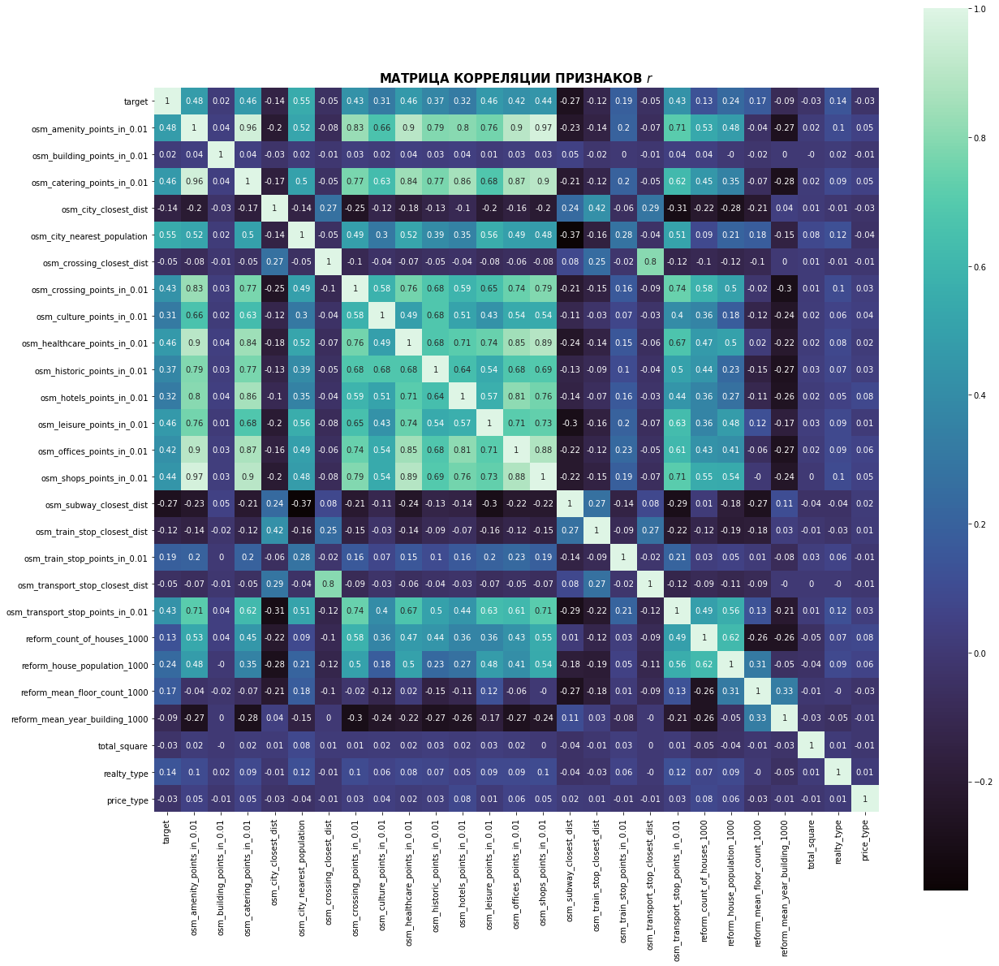

In [57]:
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(train[columns_for_pearson].corr().round(2), annot=True, square=True, cmap='mako')
ax.set_title(label = 'МАТРИЦА КОРРЕЛЯЦИИ ПРИЗНАКОВ $r$', fontdict={'fontsize': 15, 'fontweight': 'bold'})
plt.show();

**Итого:** наибольший коэф.корреляции с целевым признаком показал признак *osm_city_nearest_population* (население ближайшего города). В целом высокую взаимную корреляцию имеют признаки, содержащие информацию о инфраструктуре места, где расплогается комм.недвижимость - количество мед.заведений, ресторанов, магазинов.

### Optuna

Для поиска оптимальных параметров модели был использован фреймворк optuna. Однако, процесс поиска параметров для CatBoostRegressor является достаточно затяжным, даже для 10 итераций, поэтому параметры, которые могли бы улучшить скор так и не получилось найти.

In [58]:
#!pip install optuna

In [59]:
import optuna
import random
from optuna.samplers import TPESampler
sampler = TPESampler(seed=42)

def create_model(trial):
    iterations= trial.suggest_int('iterations', 100, 500)
    depth = trial.suggest_int('max_depth', 1, 16)
    learning_rate = trial.suggest_uniform('learning_rate', 0.00001, 0.99)
    
    model = CatBoostRegressor(iterations= iterations,
    learning_rate= learning_rate,
    depth=depth,
    task_type= 'CPU',
    early_stopping_rounds= 90)
    return model

def objective(trial):
    model = create_model(trial)
    X_train, X_test, y_train, y_test = train_test_split(dataset.drop(key_cols, axis=1), dataset['target'], random_state=random.randint(1, 10000))
    model.fit(X_train, y_train,cat_features=cat_cols)
    result = model.predict(X_test)
    score = deviation_metric(y_test.values, result)
    return score

# раскоментить надо последние 3 строчки для запуска оптимизатора, результат у меня вышел, показанный ниже

#study = optuna.create_study(direction="minimize", sampler=sampler)
#study.optimize(objective, n_trials=10, n_jobs = multiprocessing.cpu_count())
#params_catboost = study.best_params

In [60]:
#params_catboost

### Модель

В качестве модели были использованы CatBoostRegressor и LGBRegressor, однако первый показал лучший скор.

### Валидация

Как говорилось выше, данные распределены по времени, поэтому валидироваться не обходимо также по времени:

![alt text](https://miro.medium.com/max/558/1*AXRu72CV1hdjLfODFGbMWQ.png "Title")



In [61]:
key_cols = ['id', 'date', 'price_type', 'month', 'target', 'log_target']
cat_cols = ['city', 'osm_city_nearest_name', 'region', 'realty_type', 'street', 'floor']

In [62]:
# месяц с которого начнем валидироваться
start_month = '2020-04-01'

# месяцы для валидации
val_months = (
    train[(train['price_type']==1) & (train['month'] > start_month)]['month']
    .drop_duplicates()
    .sort_values()
    .tolist()
)

In [63]:
main_model = CatBoostRegressor(loss_function='MAE', verbose=0)
dataset = train[train['price_type']==1]

scores = []

for month in tqdm(val_months):
    Xy_train = dataset[(dataset['month'] < month)].reset_index(drop=True)
    Xy_val = dataset[(dataset['month'] == month)].reset_index(drop=True)
    
    model = clone(main_model)
    model = CatBoostRegressor(loss_function='MAE', verbose=0)
    model = model.fit(Xy_train.drop(key_cols, axis=1), Xy_train['log_target'], cat_features=cat_cols)

    metric = deviation_metric(Xy_val['log_target'], model.predict(Xy_val.drop(key_cols, axis=1)))
    scores.append(metric)
    
print(f'Средняя метрика по бинам: {np.mean(scores):.3f}')
print(f'Отклонение метрики по бинам: {np.std(scores):.3f}')

  0%|          | 0/4 [00:00<?, ?it/s]

Средняя метрика по бинам: 0.004
Отклонение метрики по бинам: 0.005


In [64]:
feat_im = model.get_feature_importance(prettified=True)
feat_im

,Feature Id,Importances
0,city,15.925714
1,total_square,9.964082
2,region,4.021477
3,osm_city_nearest_name,3.946062
4,floor,3.645039
...,...,...
68,osm_culture_points_in_0.001,0.124594
69,osm_train_stop_points_in_0.01,0.095635
70,osm_train_stop_points_in_0.0075,0.027828
71,osm_train_stop_points_in_0.005,0.027123


# Финальная модель

Обучим финальную модель и сделаем предикт

In [65]:
Xy_train = dataset#.reset_index(drop=True)
Xy_test = test#.reset_index(drop=True)

model = clone(main_model)
model = CatBoostRegressor(verbose= 0, loss_function='MAE')
model = model.fit(Xy_train.drop(key_cols, axis=1), Xy_train['log_target'], cat_features=cat_cols) #.drop(key_cols, axis=1)

In [66]:
model.score(Xy_train.drop(key_cols, axis=1), Xy_train['log_target'])

0.7990702057741566

In [67]:
Xy_test = test[dataset.columns]

In [68]:
Xy_test['log_target'] = model.predict(Xy_test.drop(key_cols, axis=1))#.drop(key_cols, axis=1)
Xy_test['per_square_meter_price'] = np.exp(Xy_test['log_target'])
Xy_test[['id', 'per_square_meter_price']].to_csv('28_09_2021_without_scale.csv', index=False)

### Scaling

In [69]:
# немного подрежем выбросы сверху
submission_raw = pd.DataFrame(Xy_test['id'])
submission_raw['per_square_meter_price'] = Xy_test['per_square_meter_price'] * 0.923

In [70]:
submission_raw.head()

,id,per_square_meter_price
0,COL_289284,40621.443268
1,COL_289305,41071.468580
2,COL_289318,35957.659273
3,COL_289354,96251.101221
4,COL_289399,47202.019040


In [71]:
submission_raw.to_csv('28_09_2021_with_scale_v3.csv', index=False)